# ML10 – Multi-Class Industrial Sound Classification

This notebook merges ML10 dataset processing with three classification approaches using **PyTorch**:

1. **ANN** – trained on time-domain statistical features extracted from the raw signal
2. **CNN** – trained on STFT spectrograms computed from the raw signal
3. **PANN CNN14** – transfer learning using a pre-trained AudioSet backbone (frozen weights)

All models are trained, their training process is logged, and performance is compared at the end.

## Section 1: Install & Imports

In [1]:
!pip install torchlibrosa -q

import os, urllib.request, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as sp
from scipy import signal
import pywt
import librosa

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchlibrosa.stft import Spectrogram, LogmelFilterBank

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('PyTorch version:', torch.__version__)
print('librosa version:', librosa.__version__)
print('Using device:', device)

PyTorch version: 2.11.0+cpu
librosa version: 0.11.0
Using device: cpu


## Section 2: Data Loading & Visualisation

In [2]:
# Download the industrial sound recording
file_url = (
    'https://github.com/purduelamm/purdue_me597_iiot/blob/main/'
    'ml_tutorial/Dataset_IndustrialSound/Industrial_data_Stethoscope.wav?raw=true'
)
file_path = 'Industrial_data_Stethoscope.wav'
if not os.path.exists(file_path):
    urllib.request.urlretrieve(file_url, file_path)

sound, rate = librosa.load(file_path, sr=None)
print(f'Sample rate : {rate} Hz')
print(f'Duration    : {len(sound)/rate:.2f} s  ({len(sound)} samples)')

Sample rate : 48000 Hz
Duration    : 142.46 s  (6837916 samples)


In [3]:
# Listen to the recording (Colab / Jupyter)
from IPython.display import Audio, display
display(Audio(sound, rate=rate))

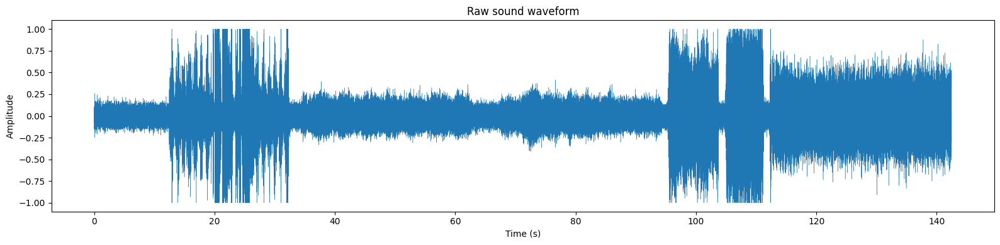

In [4]:
plt.figure(figsize=(16, 4))
plt.title('Raw sound waveform')
plt.plot(np.arange(len(sound)) / rate, sound, linewidth=0.3)
plt.xlabel('Time (s)'); plt.ylabel('Amplitude')
plt.tight_layout(); plt.show()

## Section 3: Data Indexing & Segmentation

| Class | Label | Time range (s) |
|---|---|---|
| 1 | Tool Change | 12.46 – 32.51 |
| 2 | Chip Conveyer | 32.51 – 65.57 |
| 3 | Moving X axis | 65.57 – 95.30 |
| 4 | Moving Y axis | 95.30 – 104.36 |
| 5 | Moving Z axis | 104.36 – 112.12 |
| 6 | Spindle Movement | 112.12 – end |

In [5]:
CLASS_NAMES = ['Tool Change', 'Chip Conveyer',
               'Moving X', 'Moving Y', 'Moving Z', 'Spindle']
NUM_CLASS   = len(CLASS_NAMES)

timestamps  = [12.46, 32.51, 65.57, 95.30, 104.36, 112.12]
indices     = np.multiply(rate, timestamps).astype(np.int64)

# Split into class segments
raw_classes = []
for i in range(NUM_CLASS):
    if i == NUM_CLASS - 1:
        raw_classes.append(sound[indices[i]:])
    else:
        raw_classes.append(sound[indices[i]:indices[i+1]])

for i, c in enumerate(raw_classes):
    print(f'Class {i+1} ({CLASS_NAMES[i]:16s}): {len(c)} samples  '
          f'({len(c)/rate:.2f} s)')

Class 1 (Tool Change     ): 962400 samples  (20.05 s)
Class 2 (Chip Conveyer   ): 1586879 samples  (33.06 s)
Class 3 (Moving X        ): 1427041 samples  (29.73 s)
Class 4 (Moving Y        ): 434880 samples  (9.06 s)
Class 5 (Moving Z        ): 372480 samples  (7.76 s)
Class 6 (Spindle         ): 1456156 samples  (30.34 s)


In [6]:
# Fixed-length segmentation: 1-second window, 0.8-second overlap
SEGMENT_LEN = int(1.0 * rate)
OVERLAP     = int(0.8 * rate)
STEP        = SEGMENT_LEN - OVERLAP

def segmentation(data):
    segs, start = [], 0
    while start + SEGMENT_LEN <= len(data):
        segs.append(data[start: start + SEGMENT_LEN])
        start += STEP
    return np.array(segs, dtype=np.float32)

segments_per_class = [segmentation(c) for c in raw_classes]
for i, s in enumerate(segments_per_class):
    print(f'Class {i+1} ({CLASS_NAMES[i]:16s}): {s.shape[0]} segments')

Class 1 (Tool Change     ): 96 segments
Class 2 (Chip Conveyer   ): 161 segments
Class 3 (Moving X        ): 144 segments
Class 4 (Moving Y        ): 41 segments
Class 5 (Moving Z        ): 34 segments
Class 6 (Spindle         ): 147 segments


### Visualising Class Boundaries and Segmentation Windows

The top panel colours each class region on the full waveform. The bottom panel zooms into one class and overlays every 1-second sliding window (0.8 s overlap) so you can see how densely the signal is sampled.

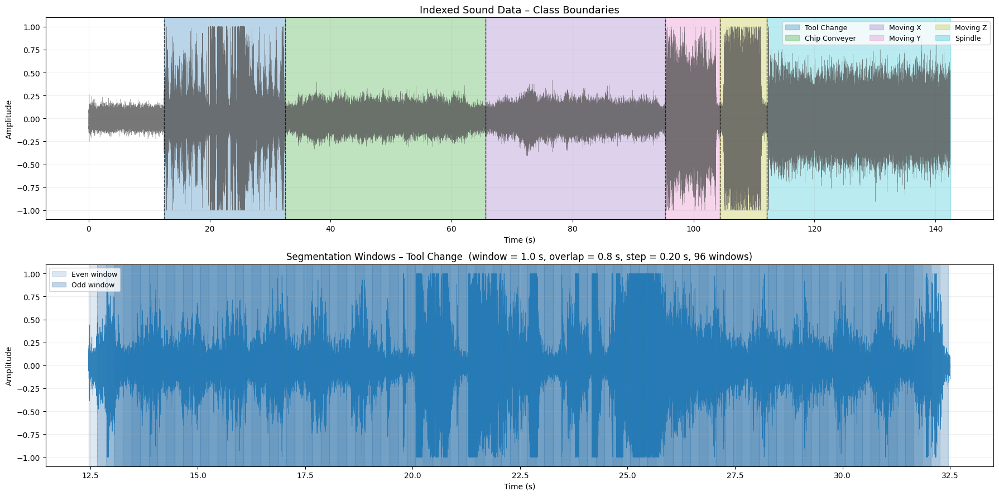

Total segments across all classes: 623


In [7]:
import matplotlib.patches as mpatches

cmap   = plt.cm.get_cmap('tab10', NUM_CLASS)
t_axis = np.arange(len(sound)) / rate          # full time axis (seconds)
t_ends = list(timestamps[1:]) + [len(sound) / rate]  # end of each class

fig, axes = plt.subplots(2, 1, figsize=(18, 9))

# ── Top: full waveform with class regions ─────────────────────────────────
axes[0].plot(t_axis, sound, color='#555555', linewidth=0.25, alpha=0.8)
for i in range(NUM_CLASS):
    axes[0].axvspan(timestamps[i], t_ends[i],
                   alpha=0.30, color=cmap(i), label=CLASS_NAMES[i])
    axes[0].axvline(timestamps[i], color='black',
                   linewidth=1.0, linestyle='--', alpha=0.7)
axes[0].set_title('Indexed Sound Data – Class Boundaries', fontsize=13)
axes[0].set_xlabel('Time (s)'); axes[0].set_ylabel('Amplitude')
axes[0].legend(loc='upper right', fontsize=9, ncol=3)
axes[0].grid(alpha=0.2)

# ── Bottom: zoom into Class 1 with segmentation windows ───────────────────
ZOOM_CLASS   = 0                              # change to inspect other classes
seg_start_s  = timestamps[ZOOM_CLASS]         # absolute start (seconds)
seg_start_sa = indices[ZOOM_CLASS]            # absolute start (samples)
class_sig    = raw_classes[ZOOM_CLASS]
t_class      = seg_start_s + np.arange(len(class_sig)) / rate

axes[1].plot(t_class, class_sig,
             color=cmap(ZOOM_CLASS), linewidth=0.5, alpha=0.9)

# Draw every segmentation window as an alternating shaded rectangle
start = 0; win_idx = 0
while start + SEGMENT_LEN <= len(class_sig):
    t_win_start = seg_start_s + start / rate
    t_win_end   = t_win_start + SEGMENT_LEN / rate
    axes[1].axvspan(t_win_start, t_win_end,
                   alpha=0.18 if win_idx % 2 == 0 else 0.32,
                   color='steelblue')
    # Mark window boundary with a thin tick at the top
    axes[1].axvline(t_win_start, color='steelblue',
                   linewidth=0.6, linestyle=':', alpha=0.6)
    start   += STEP
    win_idx += 1

n_segs = segments_per_class[ZOOM_CLASS].shape[0]
axes[1].set_title(
    f'Segmentation Windows – {CLASS_NAMES[ZOOM_CLASS]}  '
    f'(window = {SEGMENT_LEN/rate:.1f} s, '
    f'overlap = {OVERLAP/rate:.1f} s, '
    f'step = {STEP/rate:.2f} s, '
    f'{n_segs} windows)', fontsize=12)
axes[1].set_xlabel('Time (s)'); axes[1].set_ylabel('Amplitude')
axes[1].grid(alpha=0.2)

# Custom legend
patch_even = mpatches.Patch(color='steelblue', alpha=0.18, label='Even window')
patch_odd  = mpatches.Patch(color='steelblue', alpha=0.32, label='Odd window')
axes[1].legend(handles=[patch_even, patch_odd], fontsize=9)

plt.tight_layout(); plt.show()
print(f'Total segments across all classes: '
      f'{sum(s.shape[0] for s in segments_per_class)}')

## Section 4: Train / Validation / Test Split (68 % / 12 % / 20 %)

We use a **three-way stratified split** so that every class is represented proportionally in all three sets:

1. **Test set (20 %)** — split per class first using `train_test_split`; held out entirely until the final evaluation in Section 8.
2. **Validation set (15 % of the remaining 80 %)** — split from the training pool with `stratify=y_train`; used only for per-epoch monitoring and `EarlyStopping`. Never used for weight updates or final reporting.
3. **Training set (remaining ≈ 68 %)** — the only data the models learn from.

In [8]:
TEST_RATIO = 0.20
VAL_RATIO  = 0.15
RANDOM_STATE = 42

train_segs, test_segs = [], []
train_labels_list, test_labels_list = [], []

for class_idx, segs in enumerate(segments_per_class):
    tr, te = train_test_split(segs, test_size=TEST_RATIO, random_state=RANDOM_STATE)
    train_segs.append(tr);  test_segs.append(te)
    train_labels_list.extend([class_idx] * len(tr))
    test_labels_list.extend([class_idx]  * len(te))

X_train_raw = np.concatenate(train_segs, axis=0)
X_test_raw  = np.concatenate(test_segs,  axis=0)
y_train     = np.array(train_labels_list, dtype=np.int64)
y_test      = np.array(test_labels_list, dtype=np.int64)

# Stratified validation split
X_train_raw, X_val_raw, y_train, y_val = train_test_split(
    X_train_raw, y_train,
    test_size    = VAL_RATIO,
    stratify     = y_train,
    random_state = RANDOM_STATE,
)

print(f'Train : {X_train_raw.shape[0]} segments  class dist: {np.bincount(y_train)}')
print(f'Val   : {X_val_raw.shape[0]} segments   class dist: {np.bincount(y_val)}')
print(f'Test  : {X_test_raw.shape[0]} segments   class dist: {np.bincount(y_test)}')

# PyTorch Training Helper Functions
def train_pytorch_model(model, train_loader, val_loader, criterion, optimizer, epochs, patience, filepath='best.pth'):
    best_val_loss = float('inf')
    counter = 0
    history = {'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': []}

    for epoch in range(epochs):
        model.train()
        train_loss, train_corr = 0.0, 0
        for X_b, y_b in train_loader:
            X_b, y_b = X_b.to(device), y_b.to(device)
            optimizer.zero_grad()
            logits = model(X_b)
            loss = criterion(logits, y_b)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * X_b.size(0)
            train_corr += (logits.argmax(1) == y_b).sum().item()

        model.eval()
        val_loss, val_corr = 0.0, 0
        with torch.no_grad():
            for X_b, y_b in val_loader:
                X_b, y_b = X_b.to(device), y_b.to(device)
                logits = model(X_b)
                loss = criterion(logits, y_b)
                val_loss += loss.item() * X_b.size(0)
                val_corr += (logits.argmax(1) == y_b).sum().item()

        t_loss = train_loss / len(train_loader.dataset)
        t_acc  = train_corr / len(train_loader.dataset)
        v_loss = val_loss / len(val_loader.dataset)
        v_acc  = val_corr / len(val_loader.dataset)

        history['loss'].append(t_loss); history['accuracy'].append(t_acc)
        history['val_loss'].append(v_loss); history['val_accuracy'].append(v_acc)

        if v_loss < best_val_loss:
            best_val_loss = v_loss
            torch.save(model.state_dict(), filepath)
            counter = 0
        else:
            counter += 1

        if (epoch+1) % 10 == 0 or epoch == 0:
            print(f'Epoch {epoch+1:03d} | Loss: {t_loss:.4f} | Acc: {t_acc:.4f} | Val Loss: {v_loss:.4f} | Val Acc: {v_acc:.4f}')

        if counter >= patience:
            print(f'Early stopping triggered at epoch {epoch + 1}')
            break

    model.load_state_dict(torch.load(filepath))
    return history

def evaluate_model(model, test_loader, criterion):
    model.eval()
    test_loss, test_corr = 0.0, 0
    preds = []
    with torch.no_grad():
        for X_b, y_b in test_loader:
            X_b, y_b = X_b.to(device), y_b.to(device)
            logits = model(X_b)
            loss = criterion(logits, y_b)
            test_loss += loss.item() * X_b.size(0)
            p = logits.argmax(1)
            test_corr += (p == y_b).sum().item()
            preds.extend(p.cpu().numpy())
    return test_loss / len(test_loader.dataset), test_corr / len(test_loader.dataset), preds

Train : 420 segments  class dist: [ 64 109  98  27  23  99]
Val   : 75 segments   class dist: [12 19 17  5  4 18]
Test  : 128 segments   class dist: [20 33 29  9  7 30]


## Section 5: ANN – Statistical Feature-Based Multi-Classification

**Full pipeline:**

```
All segments (train + test)
   ↓  extract_all_features()
   10 time-domain stats + 80 wavelet stats (10 × 8 levels)  =  90 features
   ↓  One-way ANOVA (sp.f_oneway) across all 6 classes
   ↓  Sort by p-value ascending; keep top-30 feature indices
   ↓  Apply index selection to train & test feature matrices separately
   ↓  StandardScaler  (fit on train only)
ANN (Linear → BatchNorm1d → Dropout × 2 → Linear)
```


In [9]:
FEATURE_NAMES_TIME = ['Max', 'Min', 'Mean', 'RMS', 'Variance',
                      'Skewness', 'Kurtosis', 'Crest Factor',
                      'Shape Factor', 'Impulse Factor']
NUM_TIME_FEAT  = len(FEATURE_NAMES_TIME)
WAVELET        = 'haar'
WAVELET_LEVEL  = 8
NUM_TOTAL_FEAT = NUM_TIME_FEAT * (1 + WAVELET_LEVEL)

def rms(x):
    return np.sqrt(np.mean(x ** 2))

def stat_vector(x):
    r = rms(x)
    mean_abs = np.mean(np.abs(x)) + 1e-10
    return np.array([
        np.max(x), np.min(x), np.mean(x), r, np.var(x),
        float(sp.skew(x)), float(sp.kurtosis(x)),
        np.max(np.abs(x)) / (r + 1e-10), r / mean_abs,
        np.max(np.abs(x)) / mean_abs,
    ], dtype=np.float32)

def extract_all_features(segments):
    feats = []
    for seg in segments:
        time_f = stat_vector(seg)
        coeffs = pywt.wavedec(seg, WAVELET, level=WAVELET_LEVEL)
        wavelet_f = np.concatenate([
            stat_vector(coeffs[WAVELET_LEVEL - k]) for k in range(WAVELET_LEVEL)
        ])
        feats.append(np.concatenate([time_f, wavelet_f]))
    return np.array(feats, dtype=np.float32)

print('Extracting features...')
X_train_feat = extract_all_features(X_train_raw)
X_val_feat   = extract_all_features(X_val_raw)
X_test_feat  = extract_all_features(X_test_raw)

X_all_feat = np.concatenate([X_train_feat, X_val_feat, X_test_feat], axis=0)
y_all      = np.concatenate([y_train, y_val, y_test], axis=0)

print(f'Train features : {X_train_feat.shape}')
print(f'Val   features : {X_val_feat.shape}')
print(f'Test  features : {X_test_feat.shape}')
print(f'All   features : {X_all_feat.shape}   ← used for ANOVA')

Extracting features...
Train features : (420, 90)
Val   features : (75, 90)
Test  features : (128, 90)
All   features : (623, 90)   ← used for ANOVA


In [10]:
# ── One-way ANOVA p-value analysis on the full dataset ────
wavelet_feat_names = [
    f'Wv_L{lv+1}_{stat}'
    for lv in range(WAVELET_LEVEL)
    for stat in FEATURE_NAMES_TIME
]
ALL_FEAT_NAMES = FEATURE_NAMES_TIME + wavelet_feat_names

class_all_feats = [X_all_feat[y_all == c] for c in range(NUM_CLASS)]
p_value_arr = np.zeros((NUM_TOTAL_FEAT, 2))
for i in range(NUM_TOTAL_FEAT):
    groups = [class_all_feats[c][:, i] for c in range(NUM_CLASS)]
    _, pv  = sp.f_oneway(*groups)
    p_value_arr[i, 0], p_value_arr[i, 1] = i, pv

p_value_df = pd.DataFrame(p_value_arr, columns=['No.', 'P-value'])
p_value_df['No.'] = p_value_df['No.'].astype(int)
p_value_rank = p_value_df.sort_values('P-value', ascending=True).reset_index(drop=True)
p_value_rank['Rank'] = p_value_rank.index + 1

print(f'Total features         : {NUM_TOTAL_FEAT}')
print(f'Features with p < 0.05 : {(p_value_df["P-value"] < 0.05).sum()}')

Total features         : 90
Features with p < 0.05 : 84


### Probabilistic Density Function (PDF) per Feature

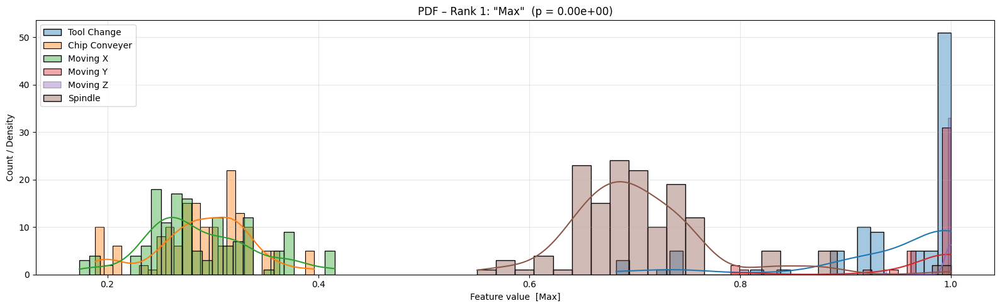

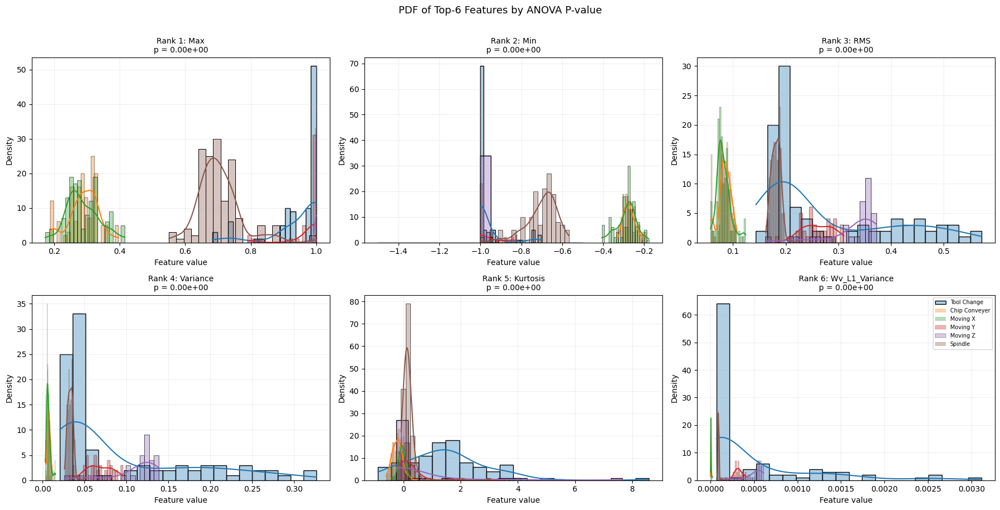

In [11]:
FEATURE_RANK = 0
feat_idx  = int(p_value_rank.iloc[FEATURE_RANK, 0])
feat_name = ALL_FEAT_NAMES[feat_idx]
feat_pval = p_value_rank.iloc[FEATURE_RANK]['P-value']

plt.figure(figsize=(16, 5))
for c in range(NUM_CLASS):
    class_vals = class_all_feats[c][:, feat_idx]
    sns.histplot(class_vals, kde=True, label=CLASS_NAMES[c], alpha=0.4, bins=25)
plt.legend(loc='best', fontsize=10)
plt.xlabel(f'Feature value  [{feat_name}]')
plt.ylabel('Count / Density')
plt.title(f'PDF – Rank {FEATURE_RANK+1}: "{feat_name}"  (p = {feat_pval:.2e})')
plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

TOP_SHOW = 6
fig, axes = plt.subplots(2, 3, figsize=(18, 9))
axes = axes.ravel()
for rank_i in range(TOP_SHOW):
    f_idx  = int(p_value_rank.iloc[rank_i, 0])
    f_name = ALL_FEAT_NAMES[f_idx]
    f_pval = p_value_rank.iloc[rank_i]['P-value']
    ax     = axes[rank_i]
    for c in range(NUM_CLASS):
        vals = class_all_feats[c][:, f_idx]
        sns.histplot(vals, kde=True, ax=ax, label=CLASS_NAMES[c], alpha=0.35, bins=20)
    ax.set_title(f'Rank {rank_i+1}: {f_name}\np = {f_pval:.2e}', fontsize=10)
    ax.set_xlabel('Feature value'); ax.set_ylabel('Density')
    ax.grid(alpha=0.2)
    if rank_i == TOP_SHOW - 1:
        ax.legend(fontsize=7, loc='best')

plt.suptitle('PDF of Top-6 Features by ANOVA P-value', fontsize=13, y=1.01)
plt.tight_layout(); plt.show()

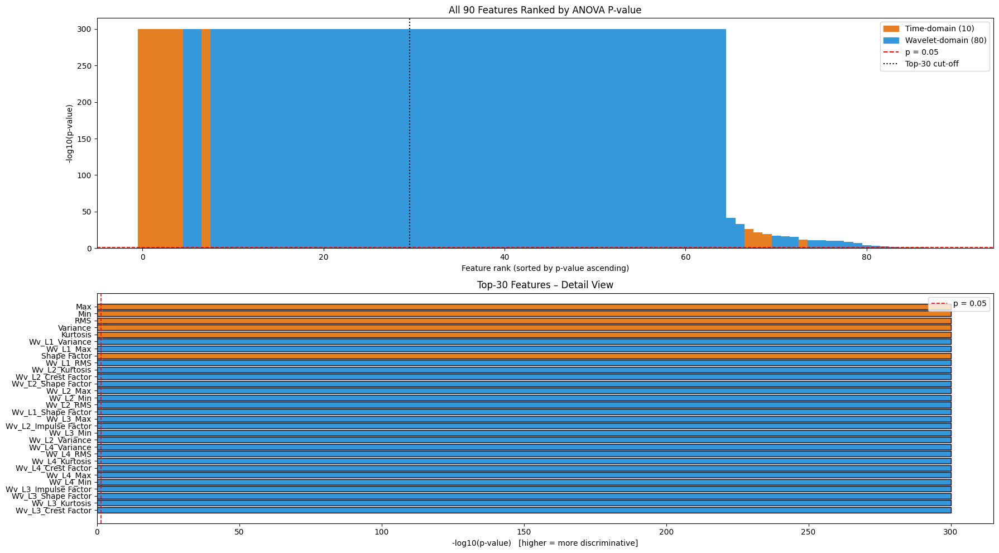

In [12]:
from matplotlib.patches import Patch
sorted_by_rank = p_value_rank.copy()
neg_log_p_rank = -np.log10(np.clip(sorted_by_rank['P-value'].values, 1e-300, 1))
bar_colors = ['#3498db' if int(row['No.']) >= NUM_TIME_FEAT else '#e67e22' for _, row in sorted_by_rank.iterrows()]

fig, axes = plt.subplots(2, 1, figsize=(18, 10))
axes[0].bar(range(NUM_TOTAL_FEAT), neg_log_p_rank, color=bar_colors, edgecolor='none', width=1.0)
axes[0].axhline(-np.log10(0.05), color='red', linestyle='--', linewidth=1.2, label='p = 0.05')
axes[0].axvline(29.5, color='black', linestyle=':', linewidth=1.5, label='Top-30 cut-off')
axes[0].set_xlabel('Feature rank (sorted by p-value ascending)')
axes[0].set_ylabel('-log10(p-value)')
axes[0].set_title('All 90 Features Ranked by ANOVA P-value')
axes[0].legend(handles=[
    Patch(color='#e67e22', label='Time-domain (10)'),
    Patch(color='#3498db', label='Wavelet-domain (80)'),
    plt.Line2D([0],[0], color='red',   linestyle='--', label='p = 0.05'),
    plt.Line2D([0],[0], color='black', linestyle=':',  label='Top-30 cut-off'),
])

top30      = p_value_rank.head(30).copy()
top30['Feature'] = top30['No.'].apply(lambda i: ALL_FEAT_NAMES[int(i)])
top30_neg  = -np.log10(np.clip(top30['P-value'].values, 1e-300, 1))
top30_colors = ['#3498db' if int(r['No.']) >= NUM_TIME_FEAT else '#e67e22' for _, r in top30.iterrows()]
axes[1].barh(top30['Feature'], top30_neg, color=top30_colors, edgecolor='k')
axes[1].axvline(-np.log10(0.05), color='red', linestyle='--', linewidth=1.2, label='p = 0.05')
axes[1].set_xlabel('-log10(p-value)   [higher = more discriminative]')
axes[1].set_title('Top-30 Features – Detail View')
axes[1].invert_yaxis(); axes[1].legend()
plt.tight_layout(); plt.show()

In [13]:
TOP_K = 30
selected_indices = p_value_rank['No.'].iloc[:TOP_K].astype(int).tolist()

X_train_feat = X_train_feat[:, selected_indices]
X_val_feat   = X_val_feat[:,   selected_indices]
X_test_feat  = X_test_feat[:,  selected_indices]

# Normalise features
scaler_ann      = StandardScaler()
X_train_feat_sc = scaler_ann.fit_transform(X_train_feat)
X_val_feat_sc   = scaler_ann.transform(X_val_feat)
X_test_feat_sc  = scaler_ann.transform(X_test_feat)

class FeatureDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)
    def __len__(self): return len(self.y)
    def __getitem__(self, idx): return self.X[idx], self.y[idx]

ann_train_loader = DataLoader(FeatureDataset(X_train_feat_sc, y_train), batch_size=32, shuffle=True)
ann_val_loader   = DataLoader(FeatureDataset(X_val_feat_sc, y_val), batch_size=32, shuffle=False)
ann_test_loader  = DataLoader(FeatureDataset(X_test_feat_sc, y_test), batch_size=32, shuffle=False)

In [33]:
# ── ANN Model Definition ─────────────────────────────
class ANNModel(nn.Module):
    def __init__(self, input_dim, num_classes, hidden1=64, hidden2=32, dropout=0.3):
        super().__init__()
        self.fc1 = nn.Linear(input_dim, hidden1)
        self.bn1 = nn.BatchNorm1d(hidden1)
        self.drop1 = nn.Dropout(dropout)

        self.fc2 = nn.Linear(hidden1, hidden2)
        self.bn2 = nn.BatchNorm1d(hidden2)
        self.drop2 = nn.Dropout(dropout)

        self.fc3 = nn.Linear(hidden2, num_classes)

    def forward(self, x):
        x = F.relu(self.bn1(self.fc1(x)))
        x = self.drop1(x)
        x = F.relu(self.bn2(self.fc2(x)))
        x = self.drop2(x)
        x = self.fc3(x)
        return x

# ── Build, train ─────────────────────────────
ann_model = ANNModel(input_dim=TOP_K, num_classes=NUM_CLASS).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ann_model.parameters(), lr=1e-3)

print("Training ANN model...")
ann_history = train_pytorch_model(
    ann_model, ann_train_loader, ann_val_loader, criterion, optimizer,
    epochs=100, patience=15, filepath='ann_best.pth'
)

Training ANN model...
Epoch 001 | Loss: 1.6890 | Acc: 0.2762 | Val Loss: 1.6295 | Val Acc: 0.4133
Epoch 010 | Loss: 0.7937 | Acc: 0.7071 | Val Loss: 0.7465 | Val Acc: 0.7200
Epoch 020 | Loss: 0.6045 | Acc: 0.7405 | Val Loss: 0.5639 | Val Acc: 0.8400
Epoch 030 | Loss: 0.5582 | Acc: 0.7762 | Val Loss: 0.4862 | Val Acc: 0.7600
Epoch 040 | Loss: 0.4995 | Acc: 0.7738 | Val Loss: 0.4407 | Val Acc: 0.8000
Epoch 050 | Loss: 0.4942 | Acc: 0.7786 | Val Loss: 0.4174 | Val Acc: 0.8133
Epoch 060 | Loss: 0.4763 | Acc: 0.7595 | Val Loss: 0.4073 | Val Acc: 0.8133
Early stopping triggered at epoch 61



ANN Test Accuracy : 0.9062
ANN Test Loss     : 0.4009


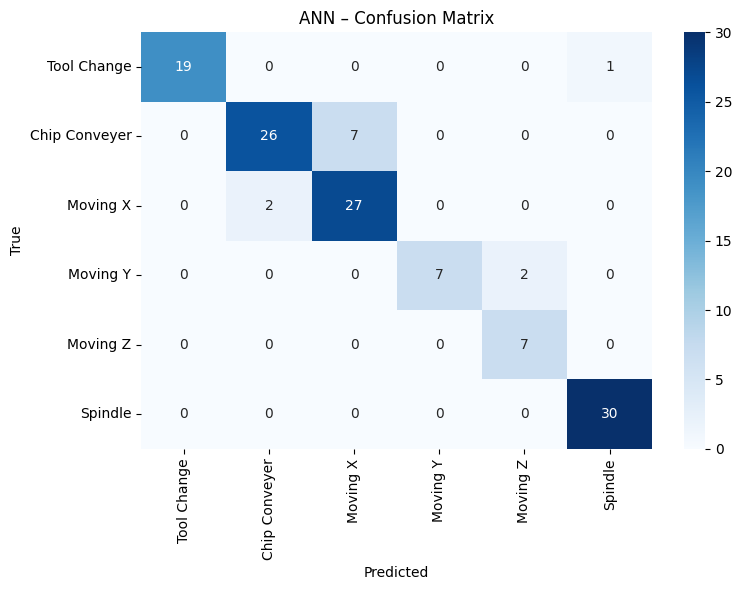

In [34]:
# ── Evaluate ANN ─────────────────────────────
ann_loss, ann_acc, y_pred_ann = evaluate_model(ann_model, ann_test_loader, criterion)
print(f'\nANN Test Accuracy : {ann_acc:.4f}')
print(f'ANN Test Loss     : {ann_loss:.4f}')

cm_ann = confusion_matrix(y_test, y_pred_ann)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_ann, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
plt.title('ANN – Confusion Matrix')
plt.ylabel('True'); plt.xlabel('Predicted')
plt.tight_layout(); plt.show()

## Section 6: CNN – STFT Spectrogram-Based Classification

**Pipeline:**

```
Raw segment  (1 s, native sample rate)
   ↓  scipy.signal.spectrogram  (nperseg=78, noverlap=10)
STFT magnitude  (~40 freq_bins × ~648 time_frames)   — naturally sized
   ↓  log1p  →  per-sample min-max  →  resize to 32×32  →  channel dim
Fixed input  (1, 32, 32)                             — compact & square
   ↓  CNN
   Conv2d(16, 3×3) → BatchNorm → MaxPool(2×2) → Dropout(0.25)
   Conv2d(32, 3×3) → BatchNorm → MaxPool(2×2) → Dropout(0.25)
   AdaptiveAvgPool2d → Dropout(0.4)
   Linear(32, NUM_CLASS)
```

In [35]:
NPERSEG  = 78
NOVERLAP = 10
TARGET_H = 32
TARGET_W = 32

def compute_stft(segments):
    specs = []
    for seg in segments:
        _, _, Zxx = signal.spectrogram(seg, fs=rate, nperseg=NPERSEG, noverlap=NOVERLAP)
        specs.append(np.abs(Zxx).astype(np.float32))
    return np.array(specs)

def prepare_cnn_input(stft_array):
    log_spec = np.log1p(stft_array)
    mn = log_spec.min(axis=(1, 2), keepdims=True)
    mx = log_spec.max(axis=(1, 2), keepdims=True)
    scaled = (log_spec - mn) / (mx - mn + 1e-8)

    # Convert to PyTorch tensor format: (N, Channels, H, W) -> (N, 1, Freq, Time)
    imgs = torch.tensor(scaled, dtype=torch.float32).unsqueeze(1)

    # Resize to TARGET_H x TARGET_W
    resized = F.interpolate(imgs, size=(TARGET_H, TARGET_W), mode='bilinear', align_corners=False)
    return resized

print('Computing STFT and reshaping...')
X_train_cnn = prepare_cnn_input(compute_stft(X_train_raw))
X_val_cnn   = prepare_cnn_input(compute_stft(X_val_raw))
X_test_cnn  = prepare_cnn_input(compute_stft(X_test_raw))

print(f'\nCNN train : {X_train_cnn.shape}')
print(f'CNN val   : {X_val_cnn.shape}')
print(f'CNN test  : {X_test_cnn.shape}')

class TensorDatasetExt(Dataset):
    def __init__(self, X_tensor, y_np):
        self.X = X_tensor
        self.y = torch.tensor(y_np, dtype=torch.long)
    def __len__(self): return len(self.y)
    def __getitem__(self, idx): return self.X[idx], self.y[idx]

cnn_train_loader = DataLoader(TensorDatasetExt(X_train_cnn, y_train), batch_size=32, shuffle=True)
cnn_val_loader   = DataLoader(TensorDatasetExt(X_val_cnn, y_val), batch_size=32, shuffle=False)
cnn_test_loader  = DataLoader(TensorDatasetExt(X_test_cnn, y_test), batch_size=32, shuffle=False)

Computing STFT and reshaping...

CNN train : torch.Size([420, 1, 32, 32])
CNN val   : torch.Size([75, 1, 32, 32])
CNN test  : torch.Size([128, 1, 32, 32])


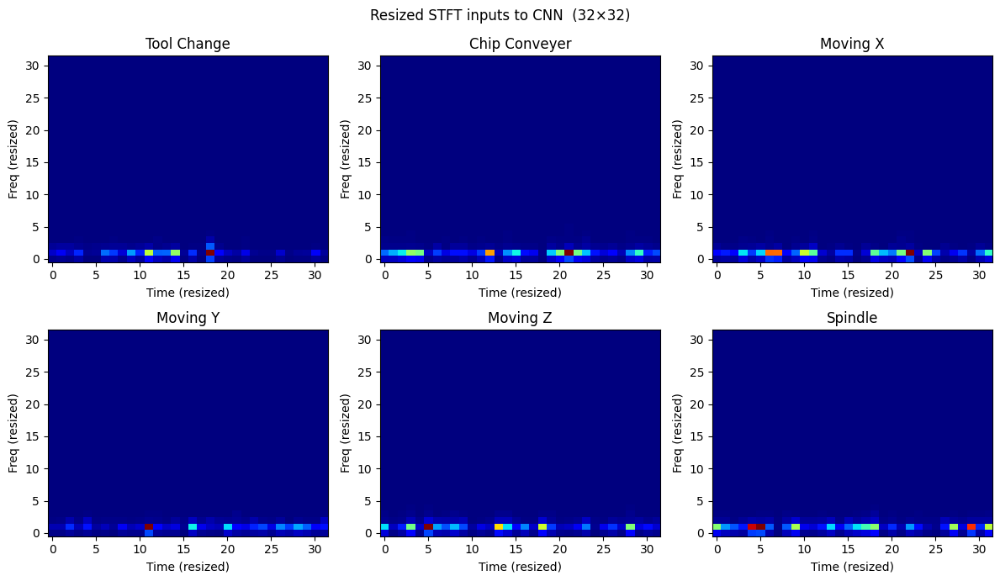

In [36]:
fig, axes = plt.subplots(2, 3, figsize=(12, 7))
axes = axes.ravel()
shown = {c: False for c in range(NUM_CLASS)}
for idx, label in enumerate(y_train):
    if not shown[label]:
        axes[label].imshow(X_train_cnn[idx, 0, :, :].numpy(), cmap='jet', aspect='auto', origin='lower')
        axes[label].set_title(f'{CLASS_NAMES[label]}')
        axes[label].set_xlabel('Time (resized)')
        axes[label].set_ylabel('Freq (resized)')
        shown[label] = True
    if all(shown.values()):
        break
plt.suptitle(f'Resized STFT inputs to CNN  ({TARGET_H}×{TARGET_W})', fontsize=12)
plt.tight_layout(); plt.show()

In [37]:
# ── CNN Model ─────────────────────────────────────────────
class CNNClassifier(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.features = nn.Sequential(
            # Input: (1, 32, 32)
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),        # 32x32 -> 16x16
            nn.Dropout2d(0.15),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),        # 16x16 -> 8x8
            nn.Dropout2d(0.20),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),        # 8x8 -> 4x4
            nn.Dropout2d(0.25),

            nn.AdaptiveAvgPool2d((1, 1))
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


cnn_model = CNNClassifier(NUM_CLASS).to(device)

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(
    cnn_model.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

print("Training CNN model...")

cnn_history = train_pytorch_model(
    cnn_model,
    cnn_train_loader,
    cnn_val_loader,
    criterion,
    optimizer,
    epochs=100,
    patience=20,
    filepath='cnn_best.pth'
)

Training CNN model...
Epoch 001 | Loss: 1.7384 | Acc: 0.2119 | Val Loss: 1.7305 | Val Acc: 0.1600
Epoch 010 | Loss: 1.6054 | Acc: 0.2857 | Val Loss: 1.6112 | Val Acc: 0.2933
Epoch 020 | Loss: 1.4294 | Acc: 0.3667 | Val Loss: 1.4839 | Val Acc: 0.3867
Epoch 030 | Loss: 1.3408 | Acc: 0.4024 | Val Loss: 1.4686 | Val Acc: 0.4133
Epoch 040 | Loss: 1.2460 | Acc: 0.4643 | Val Loss: 1.4582 | Val Acc: 0.3733
Epoch 050 | Loss: 1.1494 | Acc: 0.5167 | Val Loss: 1.1691 | Val Acc: 0.5733
Epoch 060 | Loss: 1.0067 | Acc: 0.5571 | Val Loss: 1.0828 | Val Acc: 0.5733
Epoch 070 | Loss: 0.9443 | Acc: 0.5571 | Val Loss: 1.1887 | Val Acc: 0.5067
Epoch 080 | Loss: 0.8846 | Acc: 0.6167 | Val Loss: 1.0042 | Val Acc: 0.5867
Epoch 090 | Loss: 0.8667 | Acc: 0.6310 | Val Loss: 0.9336 | Val Acc: 0.6267
Epoch 100 | Loss: 0.7536 | Acc: 0.6714 | Val Loss: 0.9414 | Val Acc: 0.6133



CNN Test Accuracy : 0.6562
CNN Test Loss     : 0.8551


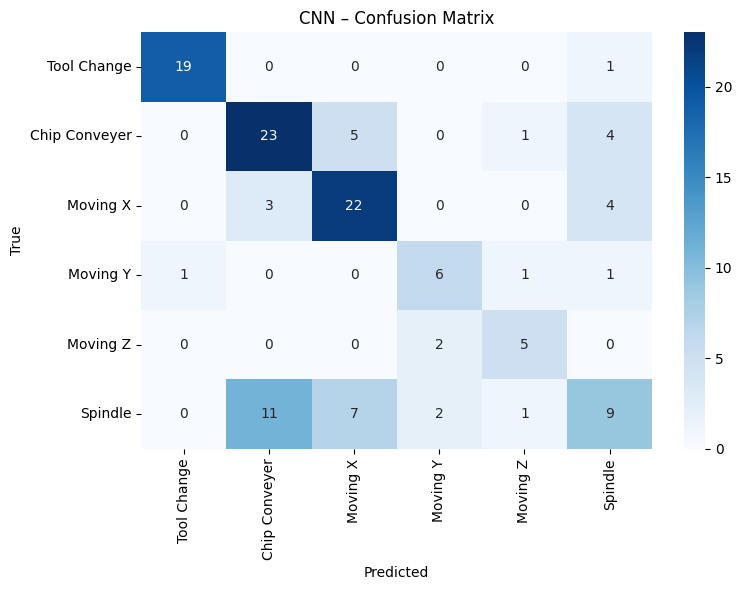

In [38]:
cnn_loss, cnn_acc, y_pred_cnn = evaluate_model(cnn_model, cnn_test_loader, criterion)
print(f'\nCNN Test Accuracy : {cnn_acc:.4f}')
print(f'CNN Test Loss     : {cnn_loss:.4f}')

cm_cnn = confusion_matrix(y_test, y_pred_cnn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
plt.title('CNN – Confusion Matrix')
plt.ylabel('True'); plt.xlabel('Predicted')
plt.tight_layout(); plt.show()

## Section 7: PANN CNN14 – Transfer Learning

**CNN14** is a PyTorch model pre-trained on AudioSet (527 general audio classes). We use it as a **frozen feature extractor**:

1. Preprocess audio by resampling to 32kHz and normalizing to [-1, 1].
2. Pass each segment through the frozen CNN14 backbone → 2048-dim embedding.
3. Train a LayerNorm + single Linear head on top.

This is *linear probing*: the backbone weights are **never updated**.

In [ ]:
CNN14_URL  = 'https://zenodo.org/record/3987831/files/Cnn14_mAP%3D0.431.pth'
CNN14_PATH = 'Cnn14_mAP=0.431.pth'

if not os.path.exists(CNN14_PATH):
    print('Downloading CNN14 pretrained weights ...')
    urllib.request.urlretrieve(CNN14_URL, CNN14_PATH)

def _init_layer(layer):
    nn.init.xavier_uniform_(layer.weight)
    if hasattr(layer, 'bias') and layer.bias is not None:
        nn.init.constant_(layer.bias, 0.)

def _init_bn(bn):
    nn.init.constant_(bn.weight, 1.)
    nn.init.constant_(bn.bias, 0.)

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1, bias=False)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 3, padding=1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.bn2   = nn.BatchNorm2d(out_channels)
        _init_layer(self.conv1); _init_layer(self.conv2)
        _init_bn(self.bn1);      _init_bn(self.bn2)

    def forward(self, x, pool_size=(2, 2)):
        x = F.relu_(self.bn1(self.conv1(x)))
        x = F.relu_(self.bn2(self.conv2(x)))
        actual_pool_time = min(pool_size[0], x.size(2))
        actual_pool_freq = min(pool_size[1], x.size(3))
        return F.avg_pool2d(x, (actual_pool_time, actual_pool_freq))

class Cnn14(nn.Module):
    def __init__(self, sample_rate=32000, window_size=1024, hop_size=320,
                 mel_bins=64, fmin=50, fmax=14000, classes_num=527):
        super().__init__()
        self.spectrogram_extractor = Spectrogram(
            n_fft=window_size, hop_length=hop_size, win_length=window_size,
            window='hann', center=True, pad_mode='reflect', freeze_parameters=True)
        self.logmel_extractor = LogmelFilterBank(
            sr=sample_rate, n_fft=window_size, n_mels=mel_bins,
            fmin=fmin, fmax=fmax, ref=1.0, amin=1e-10, top_db=None,
            freeze_parameters=True)

        self.bn0         = nn.BatchNorm2d(64)
        self.conv_block1 = ConvBlock(1,    64)
        self.conv_block2 = ConvBlock(64,   128)
        self.conv_block3 = ConvBlock(128,  256)
        self.conv_block4 = ConvBlock(256,  512)
        self.conv_block5 = ConvBlock(512,  1024)
        self.conv_block6 = ConvBlock(1024, 2048)
        self.fc1         = nn.Linear(2048, 2048, bias=True)
        self.fc_audioset = nn.Linear(2048, classes_num, bias=True)

        _init_bn(self.bn0); _init_layer(self.fc1); _init_layer(self.fc_audioset)

    def forward(self, x):
        x = self.spectrogram_extractor(x)
        x = self.logmel_extractor(x)
        x = x.transpose(1, 3); x = self.bn0(x); x = x.transpose(1, 3)

        x = self.conv_block1(x, (2, 2)); x = F.dropout(x, 0.2, self.training)
        x = self.conv_block2(x, (2, 2)); x = F.dropout(x, 0.2, self.training)
        x = self.conv_block3(x, (2, 2)); x = F.dropout(x, 0.2, self.training)
        x = self.conv_block4(x, (2, 2)); x = F.dropout(x, 0.2, self.training)
        x = self.conv_block5(x, (2, 2)); x = F.dropout(x, 0.2, self.training)
        x = self.conv_block6(x, (1, 1)); x = F.dropout(x, 0.2, self.training)

        x      = torch.mean(x, dim=3)
        x1, _  = torch.max(x, dim=2)
        x2     = torch.mean(x, dim=2)
        x      = x1 + x2

        x = F.dropout(x, 0.5, self.training)
        x = F.relu_(self.fc1(x))
        embedding = F.dropout(x, 0.5, self.training)
        clipwise_output = torch.sigmoid(self.fc_audioset(embedding))
        return embedding, clipwise_output

In [ ]:
# Preprocess for PANN (32kHz + Normalize)
def preprocess_pann(segments, orig_sr):
    processed = []
    for seg in segments:
        resampled = librosa.resample(seg, orig_sr=orig_sr, target_sr=32000)
        max_val = np.max(np.abs(resampled))
        if max_val > 0:
            resampled = resampled / max_val
        processed.append(resampled)
    return np.array(processed, dtype=np.float32)

print('Preprocessing data for PANN...')
X_train_pann = preprocess_pann(X_train_raw, rate)
X_val_pann   = preprocess_pann(X_val_raw, rate)
X_test_pann  = preprocess_pann(X_test_raw, rate)

pann_train_loader = DataLoader(FeatureDataset(X_train_pann, y_train), batch_size=32, shuffle=True)
pann_val_loader   = DataLoader(FeatureDataset(X_val_pann, y_val), batch_size=32, shuffle=False)
pann_test_loader  = DataLoader(FeatureDataset(X_test_pann, y_test), batch_size=32, shuffle=False)

In [ ]:
cnn14_base = Cnn14().to(device)
checkpoint = torch.load(CNN14_PATH, map_location=device)
cnn14_base.load_state_dict(checkpoint['model'])

class FrozenCNN14Classifier(nn.Module):
    def __init__(self, cnn14_model, num_classes):
        super().__init__()
        self.feature_extractor = cnn14_model
        for param in self.feature_extractor.parameters():
            param.requires_grad_(False)

        self.classifier = nn.Sequential(
            nn.LayerNorm(2048),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        with torch.no_grad():
            embedding, _ = self.feature_extractor(x)
        return self.classifier(embedding)

pann_model = FrozenCNN14Classifier(cnn14_base, NUM_CLASS).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(pann_model.parameters(), lr=1e-3)

print("Training PANN Transfer Learning model...")
pann_history = train_pytorch_model(
    pann_model, pann_train_loader, pann_val_loader, criterion, optimizer,
    epochs=80, patience=15, filepath='pann_best.pth'
)

In [ ]:
pann_loss, pann_acc, y_pred_pann = evaluate_model(pann_model, pann_test_loader, criterion)
print(f'\nPANN Test Accuracy : {pann_acc:.4f}')
print(f'PANN Test Loss     : {pann_loss:.4f}')

cm_pann = confusion_matrix(y_test, y_pred_pann)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_pann, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
plt.title('PANN CNN14 Transfer Learning – Confusion Matrix')
plt.ylabel('True'); plt.xlabel('Predicted')
plt.tight_layout(); plt.show()

## Section 8: Performance Comparison

In [ ]:
model_names = ['ANN (stat. features)', 'CNN (STFT)', 'PANN CNN14 (Transfer)']
accs        = [ann_acc, cnn_acc, pann_acc]
losses      = [ann_loss, cnn_loss, pann_loss]

summary_df = pd.DataFrame({
    'Model'        : model_names,
    'Test Accuracy': [f'{a:.4f}' for a in accs],
    'Test Loss'    : [f'{l:.4f}' for l in losses],
})
print(summary_df.to_string(index=False))

# ── Bar chart: test accuracy ───────────────────────────
colors = ['#4C72B0', '#DD8452', '#55A868']
plt.figure(figsize=(8, 5))
bars = plt.bar(model_names, accs, color=colors, width=0.5, edgecolor='k')
for bar, acc in zip(bars, accs):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.005,
             f'{acc:.3f}', ha='center', va='bottom', fontsize=11, fontweight='bold')
plt.ylim(0, 1.1)
plt.ylabel('Test Accuracy')
plt.title('Model Comparison – Test Accuracy')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout(); plt.show()

In [ ]:
# ── Overlay validation-accuracy training curves ─────────────
plt.figure(figsize=(10, 5))
plt.plot(ann_history['val_accuracy'], label='ANN', linewidth=2, color=colors[0])
plt.plot(cnn_history['val_accuracy'], label='CNN', linewidth=2, color=colors[1])
plt.plot(pann_history['val_accuracy'], label='PANN Transfer', linewidth=2, color=colors[2])
plt.xlabel('Epoch'); plt.ylabel('Validation Accuracy')
plt.title('Training Dynamics – Validation Accuracy (all models)')
plt.legend(); plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

In [ ]:
# ── Side-by-side confusion matrices ─────────────
short = ['TC', 'CC', 'X', 'Y', 'Z', 'Sp']
fig, axes = plt.subplots(1, 3, figsize=(22, 6))
for ax, cm_mat, title in zip(axes, [cm_ann, cm_cnn, cm_pann], ['ANN', 'CNN', 'PANN']):
    sns.heatmap(cm_mat, annot=True, fmt='d', cmap='Blues', xticklabels=short, yticklabels=short, ax=ax)
    ax.set_title(f'{title} – Confusion Matrix')
    ax.set_ylabel('True'); ax.set_xlabel('Predicted')
plt.tight_layout(); plt.show()
print('TC=Tool Change, CC=Chip Conveyer, X/Y/Z=axis movement, Sp=Spindle')

## Discussion

| Aspect | ANN (stat. features) | CNN (STFT) | PANN CNN14 (Transfer Learning) |
|---|---|---|---|
| **Input** | 30 extracted features | Resized STFT spectrogram | 2048-D pre-trained embedding |
| **Backbone parameters trained** | All (small net) | All (small net) | **None** (frozen) |
| **Training speed** | Very fast | Moderate | Fast (only linear head) |
| **Data efficiency** | Moderate | Needs more data | High (pre-trained prior) |
| **Domain knowledge needed** | Yes (feature design) | Low | None |

**Key takeaways**

- The **ANN** establishes a quick baseline. Using the top 30 ANOVA features and a tiny network, it trains in seconds.
- The **CNN** captures spectro-temporal patterns invisible to hand-crafted statistics, but needs enough data for the convolutional filters to converge from scratch.
- **PANN CNN14 transfer learning** leverages representations learned from millions of audio clips; even a single linear layer on top of the 2048-dim embedding provides an extremely robust classifier, especially when labelled data is limited.